In [1]:
##new process--2024/7/4
import numpy as np
import pandas as pd
import itertools
import holoviews as hv
from holoviews import opts, dim
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import fisher_exact
sns.set()
import math
from scipy import integrate
from statsmodels.stats.multitest import multipletests
from mpl_chord_diagram import chord_diagram
from scipy.stats import chi2_contingency
from matplotlib.colors import Normalize
# from bokeh.sampledata.airport_routes import routes, airports

In [2]:
##new process--2024/7/4
genome_df={}
with open ("all_hotspot_df_type_gene_uniq.txt") as f,open("all_hotspot_df_type_gene_sort_chord.txt","w") as fw:
    for i in f:
        i=i.strip().split("\t")
        genome_name="_".join(i[1].split("_")[:-1])
        if genome_name not in genome_df.keys():
            genome_df[genome_name]=[[],[],[]]
            genome_df[genome_name][0]=[i[0]]
            genome_df[genome_name][1]=[i[1]]
            genome_df[genome_name][2]=[i[2]]
        else:
            genome_df[genome_name][0].append(i[0])
            genome_df[genome_name][1].append(i[1])
            genome_df[genome_name][2].append(i[2])
    source=[]
    target=[]
    df=[]
    df_pair={}
    for m,n in genome_df.items():
#         print(n)
        df+=n[0]
        for nn in range(len(n[0])-1):
            for mm in range(nn+1,len(n[0])):
                print(n[0][nn],n[0][mm],file=fw)
                if n[0][nn]+"+"+n[0][mm] not in df_pair.keys() and n[0][mm]+"+"+n[0][nn] not in df_pair.keys():
                    df_pair[n[0][nn]+"+"+n[0][mm]]=1
                elif n[0][nn]+"+"+n[0][mm] in df_pair.keys():
                    df_pair[n[0][nn]+"+"+n[0][mm]]+=1
                elif n[0][mm]+"+"+n[0][nn] in df_pair.keys():
                    df_pair[n[0][mm]+"+"+n[0][nn]]+=1
                source.append(n[0][nn])
                target.append(n[0][mm])
#     print(df_pair)
    source1=[]
    target1=[]
    value=[]
    for m1,n1 in df_pair.items():
        source1.append(m1.split("+")[0])
        target1.append(m1.split("+")[1])
        value.append(n1)
    data_df = pd.DataFrame({"source":source1,"target":target1,"value":value})
    data = pd.DataFrame({"source":source,"target":target})
#     df1=list(set(df))
    with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
        print(data_df)



                         source                      target  value
0                          AbiD                    CBASS_II      4
1                          AbiD                      Gabija      4
2                          AbiD       Lamassu-Cap4_nuclease      1
3                          AbiD                 PD-Lambda-2      5
4                          AbiD                        RM_I     22
5                      CBASS_II                      Gabija     31
6                      CBASS_II       Lamassu-Cap4_nuclease      1
7                      CBASS_II                 PD-Lambda-2      4
8                      CBASS_II                        RM_I     63
9                        Gabija       Lamassu-Cap4_nuclease      8
10                       Gabija                 PD-Lambda-2      5
11                       Gabija                        RM_I     54
12        Lamassu-Cap4_nuclease                 PD-Lambda-2      1
13        Lamassu-Cap4_nuclease                        RM_I   

In [3]:
##new_process 2024/7/04
names=source1+target1
print(set(names))
node = pd.DataFrame(list(set(names)),
                    columns=['节点'])
print(node["节点"])
nodes = hv.Dataset(node, '节点',)
# nodes.data
# node
color=[]
with open("color1") as f:
    for i in f:
        i=i.strip()
        color.append(i)
with open("a1.txt") as f,open ("nine_one_df_name.txt_sed.txt") as f1:
    df=[]
    ht=[]
    for i in f:
        i=i.strip().split(",")
        ht=i
    for j in f1:
        j=j.strip()
        df.append(j)
df_color={}
for ii in range(92):
    df_color[df[ii]]=color[ii]
#     print(df[ii])
for m,n in df_color.items():
    print(m,n)


{'Retron_I_A', 'CBASS_II', 'Retron_VI', 'DRT_3', 'Avs_III', 'CRISPR-Cas IF', 'Eleos', 'Avs_II', 'PARIS_II', 'RM_IIG', 'SEFIR', 'Menshen', 'Shedu', 'BREX_I', 'RM_I', 'Pycsar', 'Retron_XII', 'Rst_HelicaseDUF2290', 'dGTPase', 'Retron_XI', 'DRT_8', 'RM_II', 'Dazbog', 'AbiU', 'Olokun', 'AbiL', 'AbiZ', 'Gabija', 'Avs_V', 'Hachiman', 'Rst_3HP', 'DarTG', 'Druantia_III', 'Thoeris_I', 'Dnd_ABCDEFGH', 'PrrC', 'Septu', 'GAPS4', 'NLR_like_bNACHT01', 'PD-T7-5', 'Gao_Qat', 'SspBCDE', 'dCTP deaminase', 'Kiwa', 'Gao_RL', 'Gao_Mza', 'DRT_9', 'Retron_III', 'AbiH', 'Retron_I_C', 'Hna', 'PD-T7-2', 'AbiJ', 'SoFic', 'Lamassu-Hydrolase_Protease', 'PD-T4-5', 'PD-Lambda-2', 'RM_IV', 'Avs_IV', 'Old_exonuclease', 'Retron_IV', 'PARIS_II_merge', 'PD-Lambda-5', 'RosmerTA', 'FS_GIY_YIG', 'AbiD', 'Gao_Iet', 'Mokosh_Type_I_C', 'Zorya_TypeI', 'Dsr_II', 'RloC', 'Gao_Her_DUF', 'Lamassu-Mrr', 'PsyrTA', 'Lamassu-Cap4_nuclease', 'PD-Lambda-1', 'CapRel', 'CBASS_I', 'DRT_2', 'PARIS_I', 'Gao_Ppl', 'Thoeris_II', 'pAgo_LongB', 'D

In [4]:
##new_process 2024/7/04
# 将无向连接合并
merged_data = {}
for _, row in data_df.iterrows():
    source = row['source']
    target = row['target']
    frequency = row['value']
    
    if (source, target) in merged_data:
        merged_data[(source, target)] += frequency
    elif (target, source) in merged_data:
        merged_data[(target, source)] += frequency
    else:
        merged_data[(source, target)] = frequency

merged_df = pd.DataFrame([(k[0], k[1], v) for k, v in merged_data.items()], columns=['source', 'target', 'frequency'])
# print(merged_df)
# 获取所有的节点
nodes = sorted(list(set(merged_df['source']).union(set(merged_df['target']))))

# 创建一个空的连接频率矩阵
frequency_matrix = pd.DataFrame(0, index=nodes, columns=nodes, dtype=float)

# 填充矩阵
for _, row in merged_df.iterrows():
    source = row['source']
    target = row['target']
    frequency = row['frequency']
    frequency_matrix.loc[source, target] = frequency
    frequency_matrix.loc[target, source] = frequency  # 因为无向图，A到C和C到A频率相同

# print("Frequency Matrix:")
# output_file1 = "df_connection_frequency_matrix1.csv"
# frequency_matrix.to_csv(output_file1, na_rep="NaN")
# print(f"Formatted Significance Matrix has been saved to {output_file1}")
# print(frequency_matrix)

In [5]:
##new_process 2024/7/04
color2=[]
for iii in nodes:
    if iii in df_color.keys():
        color2.append(df_color[iii])
    print(iii)

AbiD
AbiH
AbiJ
AbiL
AbiU
AbiZ
Avs_II
Avs_III
Avs_IV
Avs_V
BREX_I
CBASS_I
CBASS_II
CRISPR-Cas IF
CapRel
DRT_2
DRT_3
DRT_8
DRT_9
DarTG
Dazbog
Detocs
Dnd_ABCDE
Dnd_ABCDEFGH
Druantia_III
Dsr_II
Eleos
FS_GIY_YIG
GAPS4
Gabija
Gao_Her_DUF
Gao_Iet
Gao_Mza
Gao_Ppl
Gao_Qat
Gao_RL
Hachiman
Hna
Kiwa
Lamassu-Cap4_nuclease
Lamassu-Hydrolase_Protease
Lamassu-Mrr
Menshen
Mokosh_Type_I_C
NLR_like_bNACHT01
Old_exonuclease
Olokun
PARIS_I
PARIS_II
PARIS_II_merge
PD-Lambda-1
PD-Lambda-2
PD-Lambda-5
PD-T4-5
PD-T7-2
PD-T7-3
PD-T7-5
PrrC
PsyrTA
Pycsar
RM_I
RM_II
RM_IIG
RM_III
RM_IV
Retron_II
Retron_III
Retron_IV
Retron_I_A
Retron_I_C
Retron_VI
Retron_XI
Retron_XII
RloC
RosmerTA
Rst_3HP
Rst_HelicaseDUF2290
SEFIR
Septu
Shedu
ShosTA
SoFic
SspBCDE
Thoeris_I
Thoeris_II
Zorya_TypeI
dCTP deaminase
dGTPase
pAgo_LongB


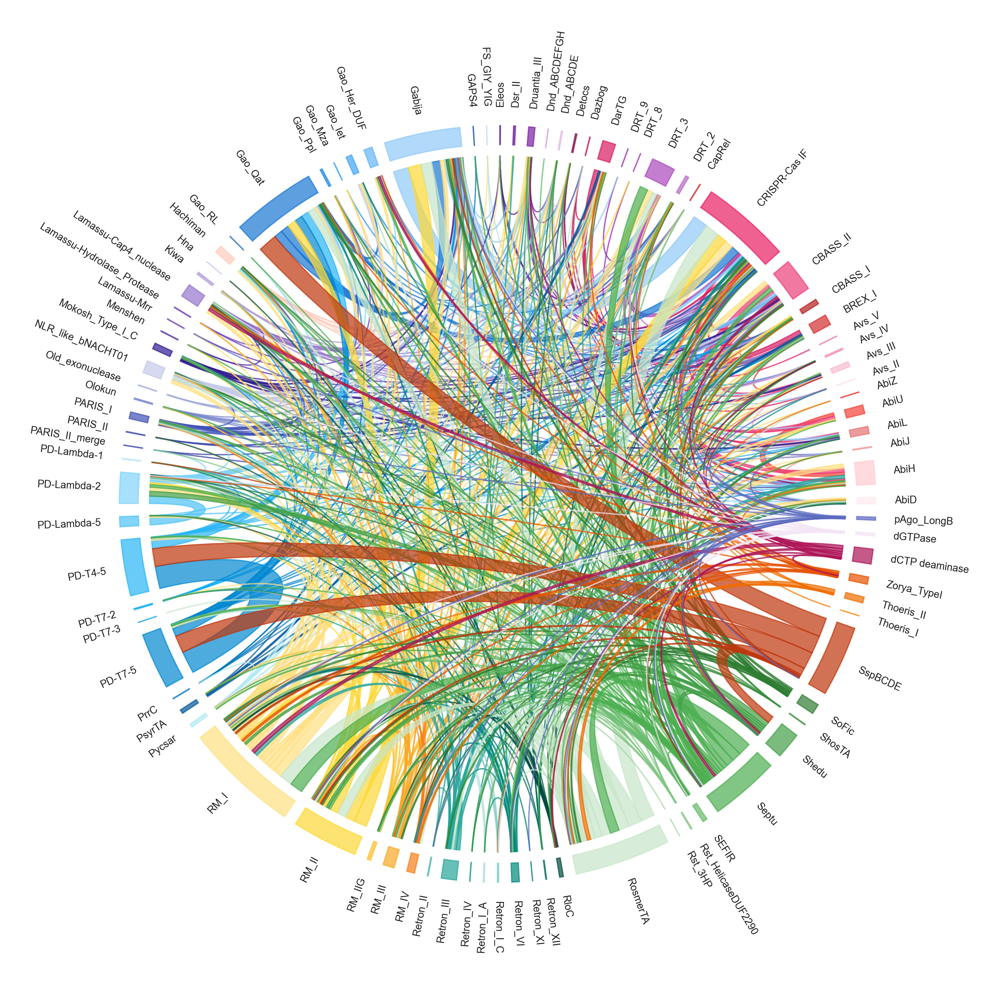

In [6]:
##new_process 2024/7/04
fig,ax = plt.subplots(figsize=(4,3.5),dpi=1000,facecolor="w")
color1=color[:-3]
# print(len(matrix[1]),len(list(set(names))))
chord_diagram(frequency_matrix,nodes,chordwidth=.5,width=.05,fontsize=2.5,ax=ax,colors=color2,rotate_names=90)
plt.tight_layout()
# plt.legend(loc='lower center',ncol=12,bbox_to_anchor=(1,1.1),fontsize=12,frameon=False)
plt.show()
# fig.savefig("df_connection_chord_fin.png",dpi=1000)


In [7]:
##new_process 2024/7/04
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from scipy.stats import fisher_exact
from itertools import product
sns.set_style("white")
config = {
    "font.family":'Times New Roman',  # 设置字体类型
#     "font.size": 80,
    "mathtext.fontset":'stix'
}
# 构造示例数据
# data = np.random.rand(10, 5)  # 10个样本，每个样本有5个特征
results = []
data=frequency_matrix.values
corr_matrix_fisher = np.zeros((data.shape[1], data.shape[1]))
p_matrix_fisher = np.zeros((data.shape[1], data.shape[1]))
p_matrix_fisher1 = np.zeros((data.shape[1], data.shape[1]))

# print(frequency_matrix.values)
# 遍历每个连接
zheng_p_value=[]
fu_p_value=[]
for i, j in product(range(frequency_matrix.values.shape[0]), range(frequency_matrix.values.shape[1])):
#     print(i,j)
    # 提取连接数
    connection = frequency_matrix.values[i, j]
    
    # 构造2x2子矩阵
    row_sum = np.sum(frequency_matrix.values[i, :]) - connection
    col_sum = np.sum(frequency_matrix.values[:, j]) - connection
    total_sum = np.sum(frequency_matrix.values) - row_sum - col_sum - connection
    
    sub_matrix = np.array([
        [connection, row_sum],
        [col_sum, total_sum]
    ])
    
    # Fisher精确检验
    oddsratio, p_value = fisher_exact(sub_matrix+0.5)
    if oddsratio<1:
        fu_p_value.append(p_value)
        if -np.log10(p_value)>3:
            p_matrix_fisher1[i, j] = -3
        else:
            p_matrix_fisher1[i, j] = np.log10(p_value)
#         fu_p_value.append(p_value)
    else:
        print(oddsratio)
        zheng_p_value.append(p_value)
        if -np.log10(p_value)>3:
            p_matrix_fisher1[i, j] = 3
        else:
            p_matrix_fisher1[i, j] = -np.log10(p_value)
#         zheng_p_value.append(p_value)
    corr_matrix_fisher[i, j] = oddsratio
    p_matrix_fisher[i, j] = p_value
    # 保存结果
    results.append({
        'connection': (i, j),
        'oddsratio': oddsratio,
        'p_value': p_value
    })


4.6300868770004575
2.852720450281426
1.7685778108711838
1.0704764605785593
2.4077311577311575
3.408826202578517
1.326883270212668
19.091023754467102
47.68125
10.575529542920847
3.8673780487804876
1.0308036482533127
3.495261495261495
33.68921308576481
12.367598684210526
38.54863612969635
8.173860482718021
1.3883411102172165
1.2300819672131147
2.8987463837994216
5.507884121745508
11.45011424219345
16.441530054644808
1.2663302688878137
2.335155888452771
7.5035
2.1295714285714284
15.285043988269795
1.5749947335159047
4.10792349726776
1.0694364988558351
12.367598684210526
100.16993464052288
284.01851851851853
1.621386630532972
22.028860028860027
10.678621659634318
1.0392112760533814
11.645977011494253
4.932610124917817
32.319302721088434
8.556281213983866
10.927598566308244
3.025058876452065
1.6465732594764853
41.548828125
1.0276983802912754
10.927598566308244
1.679375696767001
54.681003584229394
3.339663733774719
23.428571428571427
1.2417302798982188
4.307017543859649
38.54863612969635
23.

10.884285714285713
84.2032967032967
11.34077380952381
1.1485841552656697
inf
2.559254906221296
3.33219334245326
25.555724662746453
1.6654126766985864
10.219748077272452
2.4460344827586207
613.68
18.179640718562876
1534.5
2.919308943089431
68.00888888888889
91.6396551724138
72.16666666666667
6.780888888888889
1.0048828125
2.201284273208017
2.014637391882901
24.439987163029524
12.576131687242798
2.613474348486619
68.00888888888889
1.6819018831213952
2.0793545789231476
3.9402672335256606
10.285521885521886
3.408826202578517
2.335155888452771
1.0392112760533814
1.8006535473095635
14.055405405405406
1.5591542959964013
2.532492014452532
1.6369429692911568
1.1291500713483382
1.8711201079622133
3.4879502101927713
3.6059644009576353
2.8903578353604793
1.8728870858688302
1.5591542959964013
4.678812415654521
3.0803074937111083
4.288385686758829
3.1275971093044266
2.8219089130048034
9.3582995951417
3.413990755007704
2.863082863082863
3.7447670492910197
9.36394328156651
3.7447670492910197
3.6572499

In [8]:
with open("defense_mech1.txt",encoding="utf-8") as f:
    df_mech={}
    for i in f:
        i=i.strip().split("\t")
        df_mech[i[1]]=i[0]
    print(set(df_mech.values()))

{'Uknown', 'ATPase Activity', 'Phage nucleic acid cleavage', 'Cytoskeleton Involvement', 'TA', 'Nucleic Acid Interference', 'Abi', 'Calcium Regulation', 'Uknown(NLR 家族蛋白)', 'Cytokine Signaling', 'RM and RM_like', 'protein-protein interactions', 'Protein-Protein Interaction', 'Uknown(跨膜蛋白质复合体)', 'Uknown(与核酸代谢有关)', 'Nucleotide Hydrolysis'}


C:\Users\41629\AppData\Local\Temp\ipykernel_37816\2127371402.py:29: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=True,color="white",edgecolor='black', lw=1 ))
C:\Users\41629\AppData\Local\Temp\ipykernel_37816\2127371402.py:22: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=True,color="#FEFFC0",edgecolor='black', lw=1 ))


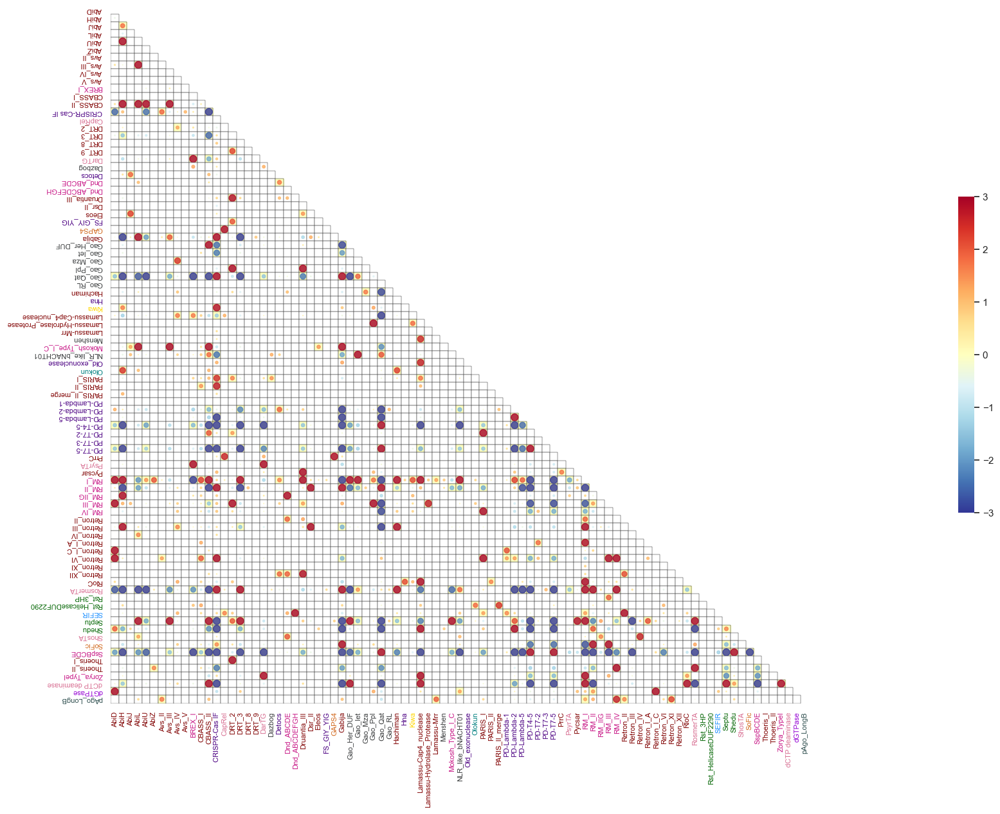

In [9]:
##new process 2024/7/04
sns.set_style("white")
config = {
    "font.family":'Times New Roman',  # 设置字体类型
#     "font.size": 80,
    "mathtext.fontset":'stix'
}
fig, ax = plt.subplots(figsize=(20, 16))
df1=pd.DataFrame(p_matrix_fisher1)
# 创建一个热图但不显示颜色填充
mask=np.triu(np.ones_like(p_matrix_fisher, dtype=bool))
sns.heatmap(df1, annot=False, cmap='RdYlBu_r', cbar=True, square=True, linewidths=0.5, linecolor='white',mask=mask, ax=ax,annot_kws={"fontsize":8},cbar_kws={"shrink": 0.4,"location": "right","pad": 0.15},)
norm = Normalize(vmin=df1.values.min(), vmax=df1.values.max())
cmap = plt.cm.RdYlBu_r

# 在热图的基础上添加白色背景并添加圆圈
for i in range(len(df1)):
    for j in range(len(df1.columns)):
        p_value = p_matrix_fisher[i, j]
        if j<i:
            if p_value < 0.05:
                ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=True,color="#FEFFC0",edgecolor='black', lw=1 ))
                ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=False,edgecolor='black', lw=0.3))
                # 填充白色背景
                size = df1.iloc[i, j]*3  # 圆圈大小根据数据大小
                color = cmap(norm(df1.iloc[i, j]))  # 圆圈颜色根据数据大小
                ax.add_patch(plt.Circle((j + 0.5, i + 0.5), size / 20, color=color, alpha=0.8))  # 调整除数以改变圆圈大小
            else:
                ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=True,color="white",edgecolor='black', lw=1 ))
                ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=False,edgecolor='black', lw=0.3))
                size = df1.iloc[i, j]*3  # 圆圈大小根据数据大小
                color = cmap(norm(df1.iloc[i, j]))  # 圆圈颜色根据数据大小
                ax.add_patch(plt.Circle((j + 0.5, i + 0.5), size / 20, color=color, alpha=0.8))  # 调整除数以改变圆圈大小
#                 ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=False,edgecolor='black', lw=0.3))
                
ax.set_xticks(np.arange(len(df1.columns)) + 0.5)
ax.set_yticks(np.arange(len(df1.index)) + 0.5)
ax.tick_params(axis='x', labeltop=False, labelbottom=True,rotation=90)
ax.tick_params(axis='y', labelright=False,labelleft=True,rotation=180)
x_labels=ax.set_xticklabels(nodes)
y_labels=ax.set_yticklabels(nodes)
for label in x_labels:
#     print("label",label.get_text())
    if df_mech[label.get_text()]=="Abi":
        label.set_color('#800000')
    elif df_mech[label.get_text()]=="RM and RM_like":
        label.set_color('#C71585')
    elif df_mech[label.get_text()]=='TA':
        label.set_color('#D87093')
    elif df_mech[label.get_text()]=="Phage nucleic acid cleavage":
        label.set_color('#4B0082')
    elif df_mech[label.get_text()]=="Nucleotide Hydrolysis":
        label.set_color('#9400D3')
    elif df_mech[label.get_text()]=="Protein-Protein Interaction" or df_mech[label.get_text()]=='protein-protein interactions':
        label.set_color('#D2691E')
    elif df_mech[label.get_text()]=="Calcium Regulation":
        label.set_color('#FFD700')
    elif df_mech[label.get_text()]=="Nucleic Acid Interference":
        label.set_color('#2F4F4F')
    elif df_mech[label.get_text()]=="Cytoskeleton Involvement":
        label.set_color('#006400')
    elif df_mech[label.get_text()]=="Cytokine Signaling":
        label.set_color('#1E90FF')
    elif df_mech[label.get_text()]=="ATPase Activity":
        label.set_color('#008080')
    else:
        label.set_color('#393b3c')
for label in y_labels:
#     print("label",label.get_text())
    if df_mech[label.get_text()]=="Abi":
        label.set_color('#800000')
    elif df_mech[label.get_text()]=="RM and RM_like":
        label.set_color('#C71585')
    elif df_mech[label.get_text()]=='TA':
        label.set_color('#D87093')
    elif df_mech[label.get_text()]=="Phage nucleic acid cleavage":
        label.set_color('#4B0082')
    elif df_mech[label.get_text()]=="Nucleotide Hydrolysis":
        label.set_color('#9400D3')
    elif df_mech[label.get_text()]=="Protein-Protein Interaction" or df_mech[label.get_text()]=='protein-protein interactions':
        label.set_color('#D2691E')
    elif df_mech[label.get_text()]=="Calcium Regulation":
        label.set_color('#FFD700')
    elif df_mech[label.get_text()]=="Nucleic Acid Interference":
        label.set_color('#2F4F4F')
    elif df_mech[label.get_text()]=="Cytoskeleton Involvement":
        label.set_color('#006400')
    elif df_mech[label.get_text()]=="Cytokine Signaling":
        label.set_color('#1E90FF')
    elif df_mech[label.get_text()]=="ATPase Activity":
        label.set_color('#008080')
    else:
        label.set_color('#393b3c')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
# for i in range(data.shape[1]):
#     for j in range(data.shape[1]):
#         if j<i:
#             p_value = p_matrix_fisher[i, j]
# #             print(p_value)
#             if p_value < 0.01:
#                 plt.text(j + 0.5, i + 0.5, '***', ha='center', va='center', color='black', fontsize=7)
#             elif p_value < 0.05:
#                 plt.text(j + 0.5, i + 0.5, '**', ha='center', va='center', color='black', fontsize=7)
#             elif p_value < 0.1:
#                 plt.text(j + 0.5, i + 0.5, '*', ha='center', va='center', color='black', fontsize=7)

# plt.title('Per Hotspot Correlation Heatmap with $P-values$')
# fig.savefig("per_hotspot_Correlation_Heatmap_spearman.png", bbox_inches='tight',dpi=800) # 减少边缘空白
# plt.xlabel('Features')
# plt.ylabel('Features')
plt.show()
# fig.savefig("genome_hotspot_df_connection_fisher_fin_2024_7_10.png",dpi=800)